In [59]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/beer-recipes/recipeData.csv
/kaggle/input/beer-recipes/styleData.csv


In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
import pandas_profiling

In [61]:
pd.set_option('max_columns', None)
beer_recipe = pd.read_csv('../input/beer-recipes/recipeData.csv', index_col='BeerID', encoding='latin1')
beer_recipe= beer_recipe.drop(columns=['UserId'])
beer_recipe.head()

,Name,URL,Style,StyleID,Size(L),OG,FG,ABV,IBU,Color,BoilSize,BoilTime,BoilGravity,Efficiency,MashThickness,SugarScale,BrewMethod,PitchRate,PrimaryTemp,PrimingMethod,PrimingAmount
BeerID,,,,,,,,,,,,,,,,,,,,,
1,Vanilla Cream Ale,/homebrew/recipe/view/1633/vanilla-cream-ale,Cream Ale,45,21.77,1.055,1.013,5.48,17.65,4.83,28.39,75,1.038,70.0,NaN,Specific Gravity,All Grain,NaN,17.78,corn sugar,4.5 oz
2,Southern Tier Pumking clone,/homebrew/recipe/view/16367/southern-tier-pumk...,Holiday/Winter Special Spiced Beer,85,20.82,1.083,1.021,8.16,60.65,15.64,24.61,60,1.070,70.0,NaN,Specific Gravity,All Grain,NaN,NaN,NaN,NaN
3,Zombie Dust Clone - EXTRACT,/homebrew/recipe/view/5920/zombie-dust-clone-e...,American IPA,7,18.93,1.063,1.018,5.91,59.25,8.98,22.71,60,NaN,70.0,NaN,Specific Gravity,extract,NaN,NaN,NaN,NaN
4,Zombie Dust Clone - ALL GRAIN,/homebrew/recipe/view/5916/zombie-dust-clone-a...,American IPA,7,22.71,1.061,1.017,5.80,54.48,8.50,26.50,60,NaN,70.0,NaN,Specific Gravity,All Grain,NaN,NaN,NaN,NaN
5,Bakke Brygg Belgisk Blonde 50 l,/homebrew/recipe/view/89534/bakke-brygg-belgis...,Belgian Blond Ale,20,50.00,1.060,1.010,6.48,17.84,4.57,60.00,90,1.050,72.0,NaN,Specific Gravity,All Grain,NaN,19.00,Sukkerlake,6-7 g sukker/l


# Exploratory data analysis

* Checking data types of each of the columns.
* Shape of the data frame.
* unique values in class label Style

In [62]:
print(beer_recipe.dtypes)
print('Data set shape:{}'.format(beer_recipe.shape))
print('Unique styles: {}'.format(beer_recipe['Style'].nunique()))

Name              object
URL               object
Style             object
StyleID            int64
Size(L)          float64
OG               float64
FG               float64
ABV              float64
IBU              float64
Color            float64
BoilSize         float64
BoilTime           int64
BoilGravity      float64
Efficiency       float64
MashThickness    float64
SugarScale        object
BrewMethod        object
PitchRate        float64
PrimaryTemp      float64
PrimingMethod     object
PrimingAmount     object
dtype: object
Data set shape:(73861, 21)
Unique styles: 175


In [63]:
report = pandas_profiling.ProfileReport(beer_recipe)

# EDA - Pandas Profiling Details

Data profiling gives us following information:

* Number of numerical columns are 15, number of categorical columns are 6
* There are missing values in Style(0.8%), BoilGravity(4%), MashingThickness(40%), PitchRate(53%), PrimaryTemp(30%),PrimimgMethod(90.8%) and PrimingAmount(93.5%).
* High correlation between BoilSize and Size, BoilTime and Size, OG and FG, BoilGravity and OG, BoilGravity and FG.
* Style has 175 unique values whereas Style id has 176 unique values, which means there is a wrong value for one row in any of the columns.


In [64]:
display(report)

/opt/conda/lib/python3.7/site-packages/IPython/core/display.py:701: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


# EDA - Distribution plots

In [65]:
print( list( beer_recipe.select_dtypes(exclude=object)))
print(list(beer_recipe.select_dtypes(include=object)))

['StyleID', 'Size(L)', 'OG', 'FG', 'ABV', 'IBU', 'Color', 'BoilSize', 'BoilTime', 'BoilGravity', 'Efficiency', 'MashThickness', 'PitchRate', 'PrimaryTemp']
['Name', 'URL', 'Style', 'SugarScale', 'BrewMethod', 'PrimingMethod', 'PrimingAmount']


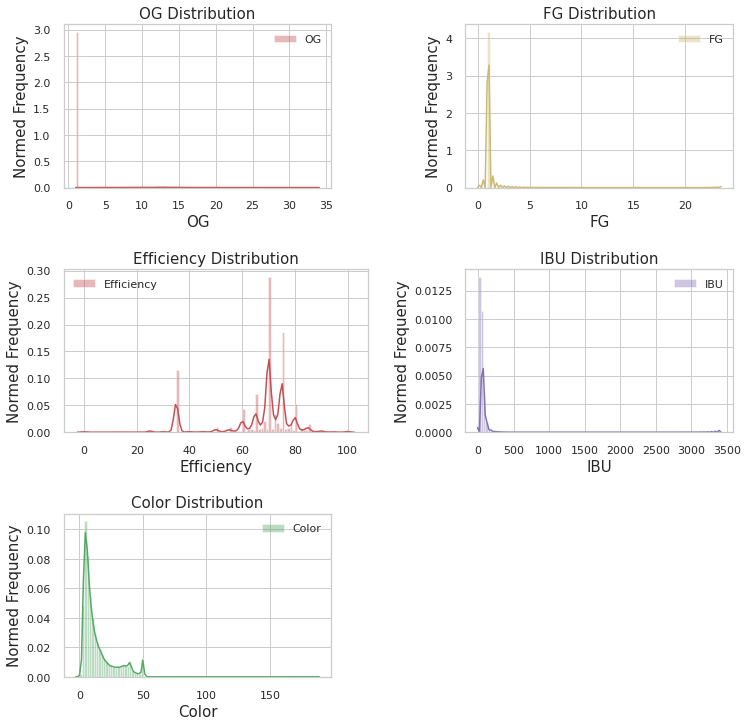

In [66]:
plt.figure(figsize=(12,12))
count=0
for col, color in zip(['OG', 'FG', 'ABV', 'IBU','Color','Efficiency'],['r','y','c','m','g','r']):
    count+=1
    if(count==6):
        plt.subplot(3,4,(5,6))
    else:
        plt.subplot(3,2,count)
    sns.distplot(beer_recipe[col], bins=100, label=col, color=color)
    plt.title('{} Distribution'.format(col), fontsize=15)
    plt.legend()
    plt.ylabel('Normed Frequency', fontsize=15)
    plt.xlabel(col, fontsize=15)

plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()

* Most of the distributions are rightly skewed, signifies there are outliers in the data

# EDA - Imbalanced Class label visualization


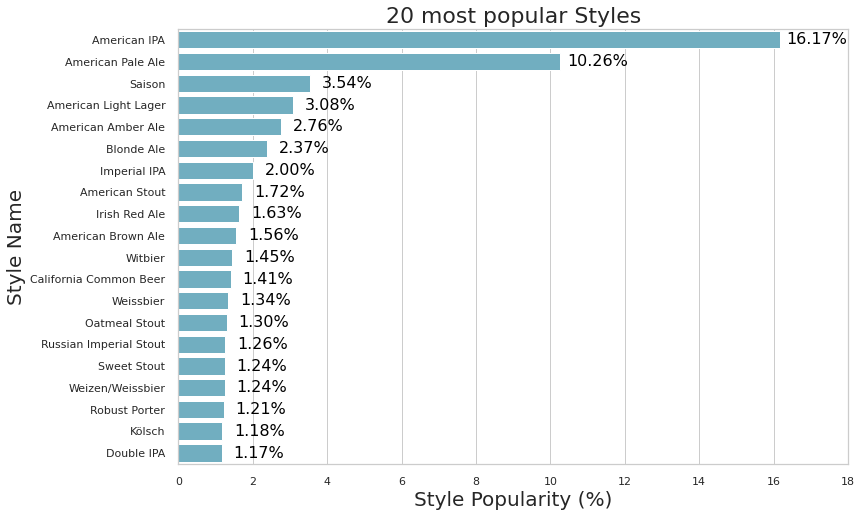

In [67]:
gb_style = beer_recipe.groupby(['Style']).count().sort_values(['Name'], ascending=False).reset_index()[:20]
gb_style['Name'] = (gb_style['Name'] / len(beer_recipe)) * 100
#print(gb_style['Name'])
plt.figure(figsize=(12,8))
g = sns.barplot(x=gb_style['Name'], y=gb_style['Style'], orient='h',color ='c')
plt.title('20 most popular Styles', fontsize=22)
plt.ylabel('Style Name', fontsize=20)
plt.xlabel('Style Popularity (%)', fontsize=20)

plt.xlim(0,18)

for index, row in gb_style.iterrows():
    g.text(y=index+0.2,x=row['Name']+1,s='{:.2f}%'.format(row['Name']),
           color='black', ha="center", fontsize=16)

plt.show()

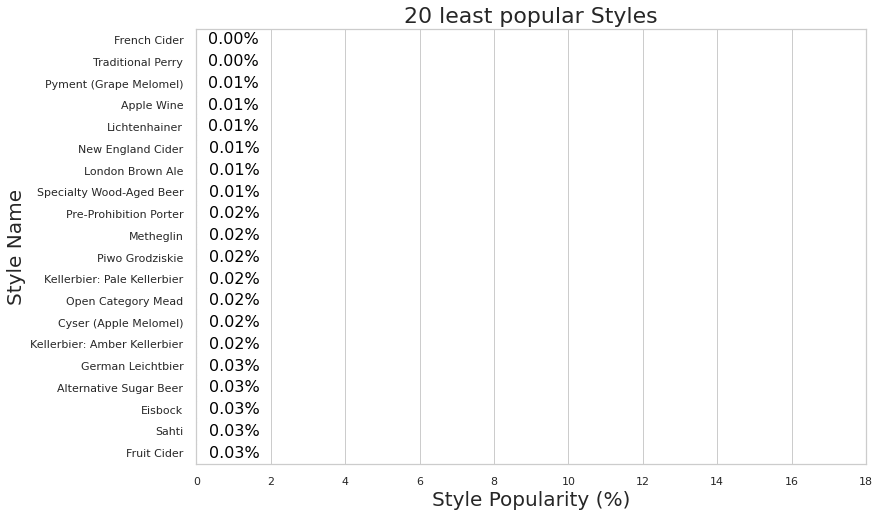

In [68]:
gb_style = beer_recipe.groupby(['Style']).count().sort_values(['Name'], ascending=True).reset_index()[:20]
gb_style['Name'] = (gb_style['Name'] / len(beer_recipe)) * 100
#print(gb_style['Name'])
plt.figure(figsize=(12,8))
g = sns.barplot(x=gb_style['Name'], y=gb_style['Style'], orient='h',color ='c')
plt.title('20 least popular Styles', fontsize=22)
plt.ylabel('Style Name', fontsize=20)
plt.xlabel('Style Popularity (%)', fontsize=20)

plt.xlim(0,18)

for index, row in gb_style.iterrows():
    g.text(y=index+0.2,x=row['Name']+1,s='{:.2f}%'.format(row['Name']),
           color='black', ha="center", fontsize=16)

plt.show()

# Data Pre-Processong

***DPP* - Missing Value Handling**
* Droping features with high null values
* Applying KNN Imputer for other fields

In [69]:
beer_recipe1 = beer_recipe.drop(['PrimingMethod', 'PrimingAmount'], axis='columns')
#Checking existing columns with null values
beer_recipe1.isnull().sum()


Name                 1
URL                  0
Style              596
StyleID              0
Size(L)              0
OG                   0
FG                   0
ABV                  0
IBU                  0
Color                0
BoilSize             0
BoilTime             0
BoilGravity       2990
Efficiency           0
MashThickness    29864
SugarScale           0
BrewMethod           0
PitchRate        39252
PrimaryTemp      22662
dtype: int64

In [70]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
X= ['BoilGravity', 'MashThickness', 'PitchRate', 'PrimaryTemp']
imputer.fit(beer_recipe1[X])
Xtrans = imputer.transform(beer_recipe1[X])



In [71]:
beer_recipe1[X] = Xtrans
beer_recipe2 = beer_recipe1# taking backup of the dataframe
print(beer_recipe2.shape)
beer_recipe1.isnull().sum()


(73861, 19)


Name               1
URL                0
Style            596
StyleID            0
Size(L)            0
OG                 0
FG                 0
ABV                0
IBU                0
Color              0
BoilSize           0
BoilTime           0
BoilGravity        0
Efficiency         0
MashThickness      0
SugarScale         0
BrewMethod         0
PitchRate          0
PrimaryTemp        0
dtype: int64

In [72]:
#beer_recipe1 = beer_recipe2

# Feature Engineering

* Encoding categorical features
* Resampling minority classes
* Adding new features into the data set
* Scaling numerical features



Encoding categorical features

In [73]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
cat_feats = ['BrewMethod','SugarScale']
#print(cat_feats)
for feat in cat_feats:
    encoder = LabelEncoder()
    beer_recipe1[feat] = encoder.fit_transform(beer_recipe1[feat])
print(beer_recipe1.dtypes)
print(beer_recipe1.shape)

Name              object
URL               object
Style             object
StyleID            int64
Size(L)          float64
OG               float64
FG               float64
ABV              float64
IBU              float64
Color            float64
BoilSize         float64
BoilTime           int64
BoilGravity      float64
Efficiency       float64
MashThickness    float64
SugarScale         int64
BrewMethod         int64
PitchRate        float64
PrimaryTemp      float64
dtype: object
(73861, 19)


# Resampling minority class

This would help us to handle imbalance class problem

Resampling all the class labels having less than 100 occurrence to sample size =200

In [74]:
from sklearn.utils import resample
numbers = [141,76,133,3,62,79,95,46,117,96,123,104,126,154,101,110,99,16,127,164,73,131,32,44,149,88,57,18,77,84,98,100,153,176,112,42,91,83,119,33,69,52,158,146,70,17,142,156,128,55,60,140,41,172,173,139,74,2,161,121,89,48,78,64,47,130,122,166,125,97]
df_upsampled =pd.DataFrame()
df_majority = beer_recipe1
for j in numbers:
    
    df_minority_j = beer_recipe1[beer_recipe1.StyleID==j]
    df_minority_upsampled = resample(df_minority_j, 
                                 replace=True,     # sample with replacement
                                 n_samples=400,    # to match majority class
                                 stratify= df_minority_j,
                                 random_state=123)
    df_upsampled = pd.concat([df_upsampled, df_minority_upsampled])
    count=count+1
#df_upsampled.StyleID.value_counts(ascending=True)
df_upsampled.StyleID.value_counts(ascending=True)



16     400
57     400
73     400
89     400
121    400
      ... 
52     400
131    400
99     400
69     400
127    400
Name: StyleID, Length: 70, dtype: int64

In [75]:
print(df_upsampled.shape)
beer_recipe1= pd.concat([beer_recipe1, df_upsampled])
beer_recipe1.StyleID.value_counts()
print(beer_recipe1.shape)

(28000, 19)
(101861, 19)


Resampling all the class labels having original occurence <500  to sample size =500

In [76]:
from sklearn.utils import resample
numbers = [163,143,138,51,124,137,165,120,1,103,43,107,71,168,82,174,38,106,49,136,29,36,59,80,61,171,40,135,8,147,66,13,160,54,50,53,63,108,93,35,118,105,113,152,116,90,151,157,85,102,109,5,19,31,23,144,72,115,34,28,27]
df_upsampled =pd.DataFrame()
df_majority = beer_recipe1
for j in numbers:
    
    df_minority_j = beer_recipe1[beer_recipe1.StyleID==j]
    df_minority_upsampled = resample(df_minority_j, 
                                 replace=True,     # sample with replacement
                                 n_samples=500,    # to match majority class
                                 stratify= df_minority_j,
                                 random_state=123)
    df_upsampled = pd.concat([df_upsampled, df_minority_upsampled])
    count=count+1
#df_upsampled.StyleID.value_counts(ascending=True)
df_upsampled.StyleID.value_counts(ascending=True)

80     500
40     500
72     500
120    500
136    500
      ... 
118    500
23     500
71     500
135    500
143    500
Name: StyleID, Length: 61, dtype: int64

In [77]:
print(df_upsampled.shape)
beer_recipe1= pd.concat([beer_recipe1, df_upsampled])
beer_recipe1.StyleID.value_counts()
print(beer_recipe1.shape)

(30500, 19)
(132361, 19)


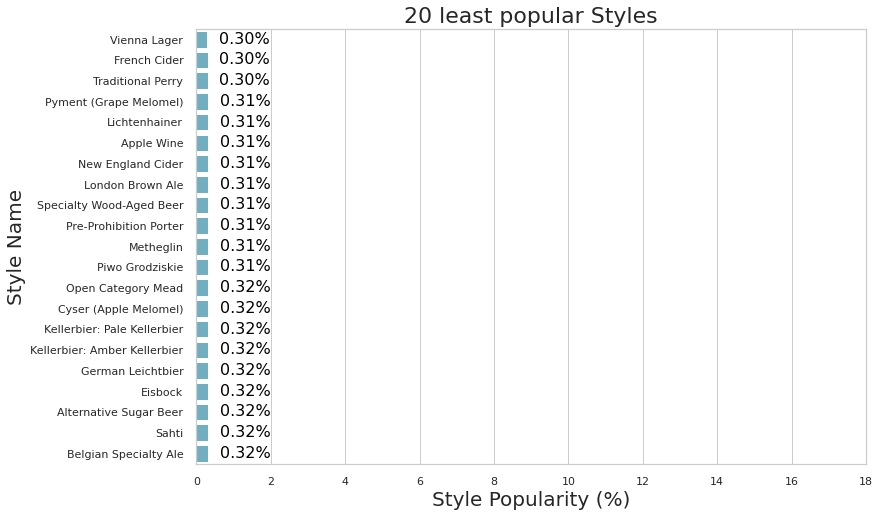

In [78]:
gb_style = beer_recipe1.groupby(['Style']).count().sort_values(['Name'], ascending=True).reset_index()[:21]
gb_style['Name'] = (gb_style['Name'] / len(beer_recipe1)) * 100
#print(gb_style['Name'])
plt.figure(figsize=(12,8))
g = sns.barplot(x=gb_style['Name'], y=gb_style['Style'], orient='h',color ='c')
plt.title('20 least popular Styles', fontsize=22)
plt.ylabel('Style Name', fontsize=20)
plt.xlabel('Style Popularity (%)', fontsize=20)

plt.xlim(0,18)

for index, row in gb_style.iterrows():
    g.text(y=index+0.2,x=row['Name']+1,s='{:.2f}%'.format(row['Name']),
           color='black', ha="center", fontsize=16)

plt.show()

We can see percentage of least occurring classes have been increased.

In [79]:
def get_sg_from_plato(plato):
    sg = 1 + (plato / (258.6 - ( (plato/258.2) *227.1) ) )
    return sg

beer_recipe1['OG_sg'] = beer_recipe1.apply(lambda row: get_sg_from_plato(row['OG']) if row['SugarScale'] == 'Plato' else row['OG'], axis=1)
beer_recipe1['FG_sg'] = beer_recipe1.apply(lambda row: get_sg_from_plato(row['FG']) if row['SugarScale'] == 'Plato' else row['FG'], axis=1)
beer_recipe1['BoilGravity_sg'] = beer_recipe1.apply(lambda row: get_sg_from_plato(row['BoilGravity']) if row['SugarScale'] == 'Plato' else row['BoilGravity'], axis=1)
med_BoilGravity_sg = round(beer_recipe1['BoilGravity_sg'].median())
beer_recipe1['BoilGravity_sg'].fillna(med_BoilGravity_sg, inplace =True)

# Test Train Split

In [80]:
x_df= beer_recipe1[list(beer_recipe1.select_dtypes(exclude=object).columns)].drop(columns=['StyleID'])
y=beer_recipe1['StyleID']
X_train, X_valid, Y_train, Y_valid = train_test_split(x_df, y, test_size=0.2, stratify =y, random_state=0)


# FE-Scaling numeric data columns

In [81]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_valid)

# Model Selection 

In [82]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier as xgb
from sklearn.metrics import accuracy_score, precision_score,recall_score, f1_score

# Regularization

In [83]:
'''model_params = {
    'svm': {
        'model': svm.SVC(gamma='auto'),
        'params' : {
            'C': [1,10,20],
            'kernel': ['rbf','linear']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(),
        'params' : {
            'n_estimators': [1,50,100]
        }
    },
    'logistic_regression' : {
        'model': LogisticRegression(solver='liblinear',multi_class='auto'),
        'params': {
            'C': [1,5,10]
        }
    },
    
    'Xgboost_classifier' : {
        'model' : XGBClassifier(gamma =2),
        'params' : {
            'lambda' : [2,3,4],
            'eta' : [0.3, 0.5,1]
        }
    }
}

'''

"model_params = {\n    'svm': {\n        'model': svm.SVC(gamma='auto'),\n        'params' : {\n            'C': [1,10,20],\n            'kernel': ['rbf','linear']\n        }  \n    },\n    'random_forest': {\n        'model': RandomForestClassifier(),\n        'params' : {\n            'n_estimators': [1,50,100]\n        }\n    },\n    'logistic_regression' : {\n        'model': LogisticRegression(solver='liblinear',multi_class='auto'),\n        'params': {\n            'C': [1,5,10]\n        }\n    },\n    \n    'Xgboost_classifier' : {\n        'model' : XGBClassifier(gamma =2),\n        'params' : {\n            'lambda' : [2,3,4],\n            'eta' : [0.3, 0.5,1]\n        }\n    }\n}\n\n"

In [84]:
'''scores = []

for model_name, mp in model_params.items():
    clf1 =  GridSearchCV(mp['model'], mp['params'], cv=2, return_train_score=False)
    clf1.fit(X_train, Y_train)
    scores.append({
        'model': model_name,
        'best_score': clf1.best_score_,
        'best_params': clf1.best_params_
        
    })
    
df1 = pd.DataFrame(scores,columns=['model','best_score','best_params'])
df1
'''

"scores = []\n\nfor model_name, mp in model_params.items():\n    clf1 =  GridSearchCV(mp['model'], mp['params'], cv=2, return_train_score=False)\n    clf1.fit(X_train, Y_train)\n    scores.append({\n        'model': model_name,\n        'best_score': clf1.best_score_,\n        'best_params': clf1.best_params_\n        \n    })\n    \ndf1 = pd.DataFrame(scores,columns=['model','best_score','best_params'])\ndf1\n"

# Model Buliding and prediction

In [85]:
#imports
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100)
#clf = XGBClassifier()
clf.fit(X_train, Y_train)
from sklearn.metrics import accuracy_score, confusion_matrix

y_pred = clf.predict(X_test)
score = accuracy_score(Y_valid, y_pred)
print('Accuracy: {}'.format(score))
from sklearn.metrics import accuracy_score, precision_score,recall_score, f1_score
print('Rand accuracy score is {:4f}'.format(accuracy_score(Y_valid,y_pred)))
print('Rand Precision score: ', precision_score(Y_valid, y_pred,average='micro'))
print('Rand Recall score: ', recall_score(Y_valid, y_pred,average='micro'))

Accuracy: 0.7327843463151135
Rand accuracy score is 0.732784
Rand Precision score:  0.7327843463151135
Rand Recall score:  0.7327843463151135


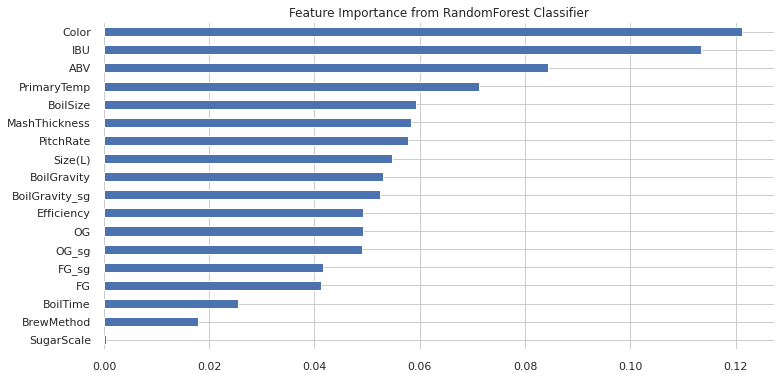

In [86]:
feats_imp = pd.DataFrame(clf.feature_importances_, index=x_df.columns, columns=['FeatureImportance'])
feats_imp = feats_imp.sort_values('FeatureImportance', ascending=False)

feats_imp.plot(kind='barh', figsize=(12,6), legend=False)
plt.title('Feature Importance from RandomForest Classifier')
sns.despine(left=True, bottom=True)
plt.gca().invert_yaxis()

In [87]:
confusion_matrix(Y_valid, y_pred)

array([[127,   0,   0, ...,   0,   0,   0],
       [  0,  87,   0, ...,   0,   0,   0],
       [  0,   0,  84, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ..., 123,   0,   0],
       [  0,   0,   0, ...,   1,  74,   0],
       [  0,   0,   0, ...,   0,   0,  93]])